TFR difference between trials that the stimulus is on the side of the bias block (expected) (e.g., on the right when the probaibility for right is 80%) and trials that stimulus is on the other side (unexpected). The first ten trial of each bias block  and trials with contrast level lower than 20% are excluded. 

In [1]:
# import libraries
import os
import numpy as np
import pandas as pd
import ast
import mne 
import sys
import submitit
import gc
import matplotlib.pyplot as plt
import re 

# Configuration 
help :
- condition (str): The condition to compare. Possible values are 'Stim_NoStim', 'Right_Left', 'BiasRight_BiasLeft', 
            'success_error', 'PrevSuccess_PrevFail', 'expected_unexpected_stim', 'Right_left_choice'.
- n_jobs (int): Number of jobs to run in parallel.
- region (str): Brain region of interest.
- tmin (float): Start time before event.
- tmax (float): End time after event.
- remove_first_trials_of_block (bool): Whether to remove the first trials of each block.
- overwrite (bool): Whether to overwrite existing files.
- min_trial (int): Minimum number of trials required for each condition.

In [3]:
params = {
    'condition': 'expected_unexpected_stim',
    'n_jobs': 5,
    'region': 'VISp',
    'tmin': -0.5,
    'tmax': 1,
    'remove_first_trials_of_block': True,
    'overwrite': False,
    'min_trial': 10
}


## get the probes id related to the region

In [4]:
region = params['region']
path_table_info = f'/crnldata/cophy/TeamProjects/mohammad/ibl-oscillations/_analyses/extraction_module/data/eid_probe_info_{region}_{region}.csv'
table = pd.read_csv(path_table_info)
table['pid1'] = table['pid1'].apply(ast.literal_eval)
pids = []
eids = []
for i, row in enumerate(table.iterrows()):
    eid = row[1]['eid']
    pid1 = row[1]['pid1']
    for pid in pid1:
        if os.path.isfile(f'/mnt/data/AdaptiveControl/IBLrawdata/pid_data/{pid}/lfp_{pid}_raw.fif'):
            pids.append(pid)
            eids.append(eid)
print(f'Number of pids with files: {len(pids)} for region {region}')

Number of pids with files: 46 for region VISp


# submit jobs

In [23]:
from functions.TFR_difference import TFR_diff

joblist = []


executor = submitit.AutoExecutor(folder=os.getcwd()+'/logs/')
executor.update_parameters(mem_gb=16, timeout_min=300, slurm_partition="CPU", cpus_per_task=params['n_jobs'], slurm_comment='compute_epochTFR')

# Submit jobs
for i, (pid, eid) in enumerate(zip(pids, eids)):
    # if i >1:
    #     break
    job = executor.submit(TFR_diff, pid, eid, **params)
    job.job_initial_indice = i
    joblist.append(job)

# Monitor jobs
clean_jobs_live = False
finished_list, finished_order = [], []

print('#### Start waiting for jobs to return #####')
while joblist:
    for i, job in enumerate(joblist):
        if job.done():
            print(f"{len(finished_list)+1} on {len(joblist)}")
            print(f"last job finished: {job.job_id}")
            if clean_jobs_live:
                del job
                gc.collect()
            else:
                finished_list.append(job)
                finished_order.append(job.job_initial_indice)
            joblist.pop(i)
            break

print('#### All jobs completed #####')
print('#### you can start plotting the result #####')


#### Start waiting for jobs to return #####
1 on 46
last job finished: 38075
2 on 45
last job finished: 38076
3 on 44
last job finished: 38114
4 on 43
last job finished: 38079
5 on 42
last job finished: 38089
6 on 41
last job finished: 38078
7 on 40
last job finished: 38077
8 on 39
last job finished: 38090
9 on 38
last job finished: 38080
10 on 37
last job finished: 38082
11 on 36
last job finished: 38083
12 on 35
last job finished: 38081
13 on 34
last job finished: 38085
14 on 33
last job finished: 38087
15 on 32
last job finished: 38103
16 on 31
last job finished: 38088
17 on 30
last job finished: 38102
18 on 29
last job finished: 38084
19 on 28
last job finished: 38104
20 on 27
last job finished: 38086
21 on 26
last job finished: 38109
22 on 25
last job finished: 38116
23 on 24
last job finished: 38105
24 on 23
last job finished: 38115
25 on 22
last job finished: 38118
26 on 21
last job finished: 38120
27 on 20
last job finished: 38111
28 on 19
last job finished: 38117
29 on 18
last

In [24]:
unseccessful_jobs = []
sucessful_jobs = []
less_than_100 = []
pids_to_plot = []
for job in finished_list:
    if job.exception() is not None:
        unseccessful_jobs.append(job)
    else:
        sucessful_jobs.append(job)
for job in sucessful_jobs:
    if type(job.result()) == int:
        less_than_100.append(job)
    else:
        pids_to_plot.append(pids[job.job_initial_indice])
        
print(f'Number of successful jobs: {len(sucessful_jobs)}')
print(f'Number of unseccessful jobs: {len(unseccessful_jobs)}')
print(f'Number of successful jobs with less than 100 epochs: {len(less_than_100)}')
for job in unseccessful_jobs:
    print(f'Unsuccessful job: {job.job_id} with error: {job.exception()}')

Number of successful jobs: 45
Number of unseccessful jobs: 1
Number of successful jobs with less than 100 epochs: 4
Unsuccessful job: 38114 with error: Job (task=0) failed during processing with trace:
----------------------
Traceback (most recent call last):
  File "/home/mohammad.keshtkar/miniconda3/envs/iblenv/lib/python3.10/site-packages/submitit/core/submission.py", line 55, in process_job
    result = delayed.result()
  File "/home/mohammad.keshtkar/miniconda3/envs/iblenv/lib/python3.10/site-packages/submitit/core/utils.py", line 133, in result
    self._result = self.function(*self.args, **self.kwargs)
  File "/tmp/ipykernel_2333340/3963397954.py", line 66, in TFR_diff
  File "/home/mohammad.keshtkar/miniconda3/envs/iblenv/lib/python3.10/site-packages/pandas/io/pickle.py", line 185, in read_pickle
    with get_handle(
  File "/home/mohammad.keshtkar/miniconda3/envs/iblenv/lib/python3.10/site-packages/pandas/io/common.py", line 882, in get_handle
    handle = open(handle, ioargs.

# Load and Plot the result

In [5]:
all_insersions = []
pids_to_plot = []
nb_channels = []
for pid in pids:
    condition = params['condition']
    path = f'/mnt/data/AdaptiveControl/IBLrawdata/TF_data/{region}/TFR_{condition}_{pid}.npy'
    if os.path.isfile(path):
        diff = np.load(path)
        nb_channel = diff.shape[0]
        diff_avg = np.mean(diff, axis=0, keepdims=False)
        all_insersions.append(diff_avg)
        pids_to_plot.append(pid)
        nb_channels.append(nb_channel)

all_insersions = np.array(all_insersions)
nb_subj = all_insersions.shape[0]   
print(all_insersions.shape)

(41, 53, 751)


## 1) grand average over all probes

I z-score normalized each session before averaging 

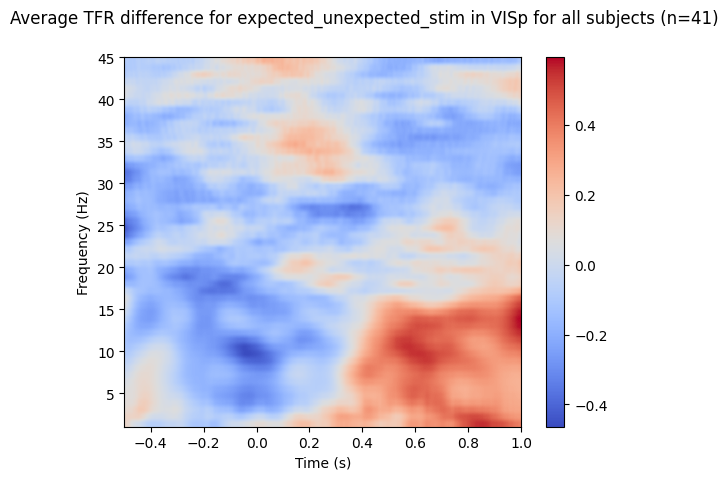

In [6]:
normalized_insersion = np.zeros_like(all_insersions)

# Z-score normalization for each subject
for i in range(all_insersions.shape[0]):
    mean = np.mean(all_insersions[i])
    std_dev = np.std(all_insersions[i])
    normalized_insersion[i] = (all_insersions[i] - mean) / std_dev

# Average over subjects after normalization
average_TF = np.mean(normalized_insersion, axis=0)
region = params['region']
tmin = params['tmin']
tmax = params['tmax']
fig, ax = plt.subplots()
fig.suptitle(f'Average TFR difference for {condition} in {region} for all subjects (n={nb_subj})')
ax.imshow(average_TF, aspect='auto', origin='lower', cmap='coolwarm', extent=[-0.6, 0, 1, 45])
fig.colorbar(ax.imshow(average_TF, aspect='auto', origin='lower', cmap='coolwarm', extent=[tmin, tmax, 1, 45]))
ax.set_xlabel('Time (s)')
ax.set_ylabel('Frequency (Hz)')
plt.show()


## 2 ) TFR per insersion

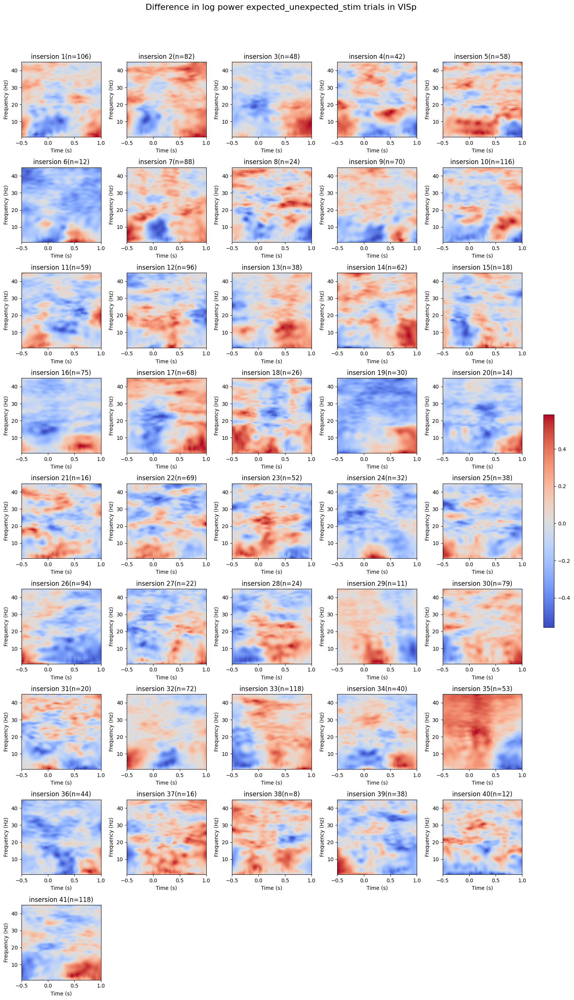

In [7]:
#  `all_insersions` is a 3D array with dimensions (nb_insersion, freqs, times)
insersion = all_insersions.shape[0]  # Number of insersions

# Set up a figure with 5 columns and enough rows to accommodate all channels
columns = 5
rows = int(np.ceil(insersion / columns))

fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 3), 
                         sharex=False, sharey=False)
fig.suptitle(f'Difference in log power {condition} trials in {region}', fontsize=16)

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through each channel and plot the differences
for i, ax in enumerate(axes[:insersion]):
    im = ax.imshow(all_insersions[i], aspect='auto', origin='lower',
                   extent= [tmin, tmax, 1, 45],
                   cmap='coolwarm')
    ax.set_title(f'insersion {i + 1}(n={nb_channels[i]})')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

# Remove any unused subplots if channels are less than the number of axes
for ax in axes[insersion:]:
    fig.delaxes(ax)

# Adjust layout and add a colorbar
fig.tight_layout(rect=[0, 0, 1, 0.95])
fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
plt.show()


# 3) TFR per  channel for each insersion

### change the insersion number to plot the individual channels for each insersion

Plotting for pid d213e786-4b1c-477d-a710-766d69fa1ac1
Opening raw data file /mnt/data/AdaptiveControl/IBLrawdata/pid_data/d213e786-4b1c-477d-a710-766d69fa1ac1/lfp_d213e786-4b1c-477d-a710-766d69fa1ac1_raw.fif...
Isotrak not found
    Range : 102483 ... 1499482 =    204.966 ...  2998.964 secs
Ready.
Opening raw data file /mnt/data/AdaptiveControl/IBLrawdata/pid_data/d213e786-4b1c-477d-a710-766d69fa1ac1/lfp_d213e786-4b1c-477d-a710-766d69fa1ac1_raw-1.fif...
Isotrak not found
    Range : 1499483 ... 2002370 =   2998.966 ...  4004.740 secs
Ready.
Reading 0 ... 1899887  =      0.000 ...  3799.774 secs...


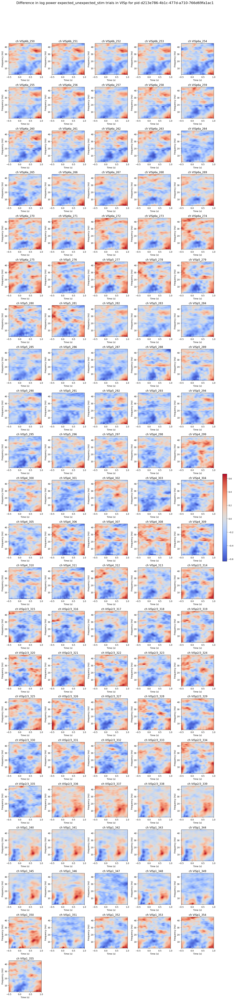

In [8]:
insersion = 1
pid = pids_to_plot[insersion-1]
print(f'Plotting for pid {pid}')
path = f'/mnt/data/AdaptiveControl/IBLrawdata/TF_data/{region}/TFR_{condition}_{pid}.npy'
diff = np.load(path)
raw = mne.io.read_raw_fif(f'/mnt/data/AdaptiveControl/IBLrawdata/pid_data/{pid}/lfp_{pid}_raw.fif', preload=True)
bad_channels = list(raw.info['bads'])
Visual_channels_clean = [ch for ch in raw.ch_names if isinstance(ch, str) and re.match(fr'^{region}[12456]', ch) and ch not in bad_channels]
del raw

global_vmax = np.max(diff)
global_vmin = np.min(diff)
channel = diff.shape[0]  # Number of channels


columns = 5
rows = int(np.ceil(channel / columns))

fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 3), 
                         sharex=False, sharey=False)

fig.suptitle(f'Difference in log power {condition} trials in {region} for pid {pid}', fontsize=16)
# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through each channel and plot the differences
for i, ax in enumerate(axes[:channel]):
    im = ax.imshow(diff[i], aspect='auto', origin='lower',
                   extent= [tmin, tmax, 1, 45],
                   cmap='coolwarm')
    ax.set_title(f'ch {Visual_channels_clean[i]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

# Remove any unused subplots if channels are less than the number of axes
for ax in axes[channel:]:
    fig.delaxes(ax)

# Adjust layout and add a colorbar
fig.tight_layout(rect=[0, 0, 1, 0.95])
fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)

plt.show()